<a href="https://colab.research.google.com/github/andrehochuli/teaching/blob/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/Lecture_04_Component_Segmentation_Exemplo_Analises.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [ ]:
#Auxiliary Function to plot side by side
def plot_sidebyside(img_list,titles,colormap=None,figsize=(12,6)):
  n = len(img_list)
  figure, axis = plt.subplots(1, n, figsize=figsize)

  for i in range(n):
    axis[i].imshow(img_list[i], cmap=colormap)
    axis[i].set_title(titles[i])
    axis[i].axis('off')
  # Combine all the operations and display
  plt.show()

In [ ]:
!wget https://github.com/andrehochuli/teaching/raw/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/Images.zip -O Images.zip
!unzip -o Images.zip

--2026-08-28 22:39:56--  https://github.com/andrehochuli/teaching/raw/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/Images.zip
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/andrehochuli/teaching/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/Images.zip [following]
--2026-08-28 22:39:56--  https://raw.githubusercontent.com/andrehochuli/teaching/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/Images.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3413100 (3.3M) [application/zip]
Saving to: ‘Images.zip’

Images.zip          100%[===================>]   3

#License Plate Characters Segmentation
The goal is to segment the chars and numbers from a license plate


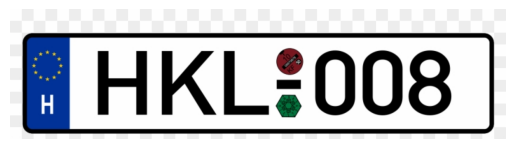

In [ ]:
#read image from disk
img_plate = cv2.imread('Images/placa5.png')
#converts to rgb to better visualize
img_plate = cv2.cvtColor(img_plate,cv2.COLOR_BGR2RGB)
plt.imshow(img_plate)
plt.axis('off')
plt.show()

#Connected Component Labelling - Classical Algorithm
* Analyzes the non-zero pixel's neighborhood (foreground)
* Label each connected pixel with a label (1,2,3,4….)

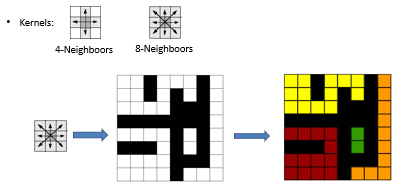

The method is implemented by cv2.connectedComponent() function





#Pre-Processing

First, we must binarize the image to segment the foreground and background.
  * Blurring to reduce brightness changes and other noises
  * Otsu threshold to binarize

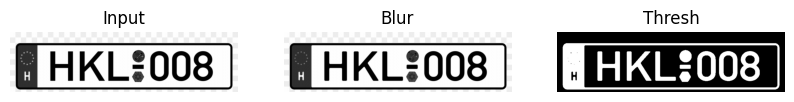

In [ ]:
gray = cv2.cvtColor(img_plate,cv2.COLOR_RGB2GRAY)

blur = cv2.medianBlur(gray,5)

_,thresh = cv2.threshold(blur,127,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plot_sidebyside([gray,blur,thresh],['Input','Blur','Thresh'],colormap='gray',figsize=(10,6))

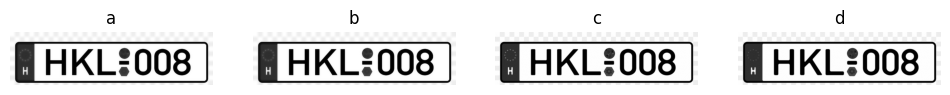

In [ ]:
gray = cv2.cvtColor(img_plate,cv2.COLOR_RGB2GRAY)
bilateral1 = cv2.bilateralFilter(gray, 15, 75, 75)
bilateral2 = cv2.bilateralFilter(gray, 15, 75, 95)
blur1 = cv2.medianBlur(gray,5)
blur2 = cv2.medianBlur(gray,7)
plot_sidebyside([bilateral1,bilateral2,blur1,blur2],['a','b','c','d'],colormap='gray')

Discussão: Visto que a cor não é relevante em placas, converti para nivel de cinza.

Aqui verificamos se o uso de filtros poderia melhorar os ruídos.

Foram analisadas duas funções de filtering e conclui-se que não houve diferença entre as abordagens. Portanto escolhemos a função blur1.

threshold 127 + otsu


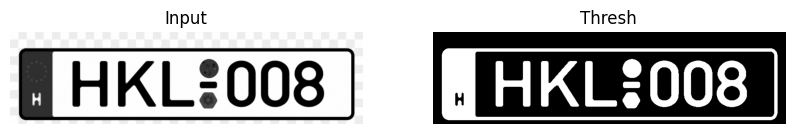

threshold 50 , sem otsu


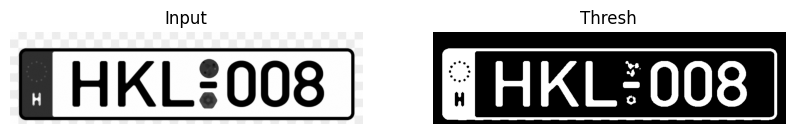

In [ ]:
print("threshold 127 + otsu")
_,thresh = cv2.threshold(blur2,127,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plot_sidebyside([blur2,thresh],['Input','Thresh'],colormap='gray',figsize=(10,6))

print("threshold 50 , sem otsu")
_,thresh = cv2.threshold(blur2,50,255,cv2.THRESH_BINARY_INV)
plot_sidebyside([blur2,thresh],['Input','Thresh'],colormap='gray',figsize=(10,6))

Afim de criar as mascaras, binarizamos a imagem utilizando otsu com threshold em 127 e somente threshold 50.

Com base nisso, a imagem com otsu denota melhor os componentes.

#The cv2.connectedComponent()
*   Returns the number of labels find
*   The labeled image
*   List of properties of components (top-left, size, area, etc.)



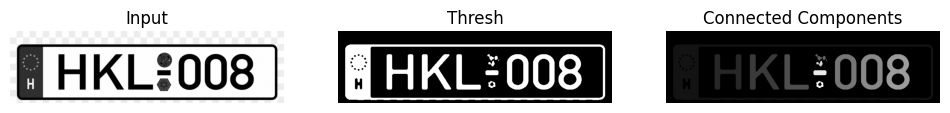

Total Labels: 14
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]


In [ ]:
connectivity = 4  # You need to choose 4 or 8 for connectivity type
num_labels, cc_image, stats, centroids = cv2.connectedComponentsWithStats(thresh , connectivity , cv2.CV_32S)
plot_sidebyside([gray,thresh,cc_image],['Input','Thresh','Connected Components'],colormap='gray')

print('Total Labels:', num_labels)
print(np.unique(cc_image))

[     0      0    840    220 137105] [438.43848875 104.15459684]


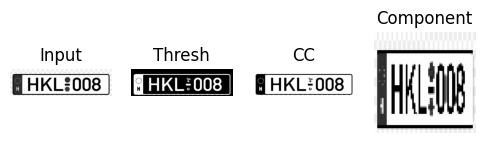

[   22    41   797   170 22980] [262.21936466 123.58559617]


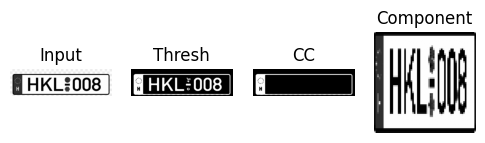

[ 149   71   82  108 4274] [189.49602246 124.42442677]


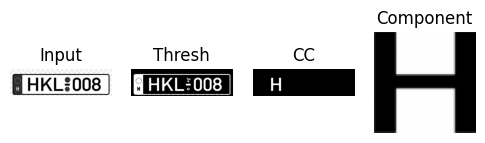

[ 257   71   90  108 4363] [291.7586523  124.72771029]


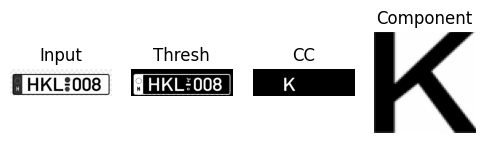

[ 363   71   75  108 2684] [382.92175857 139.52943368]


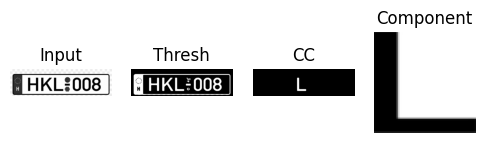

[458  71  32  19 267] [473.67790262  80.7752809 ]


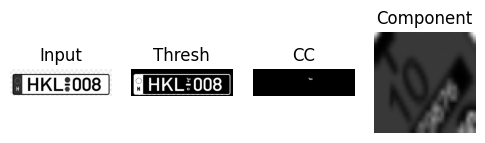

[ 518   71   66  108 3892] [550.38874615 124.49820144]


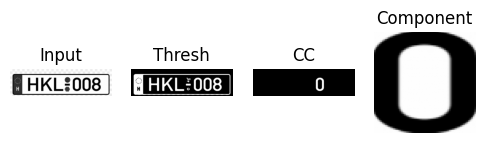

[ 598   71   66  108 3892] [630.46711202 124.49897225]


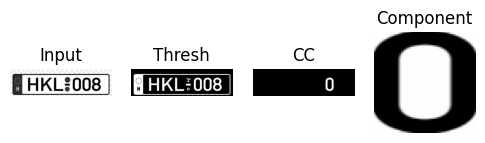

[ 676   71   71  108 4319] [710.77309562 124.94420005]


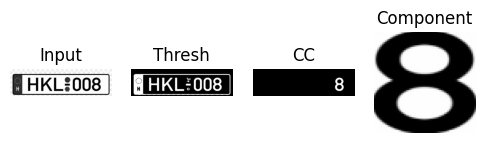

[492  87   2   5   7] [492.28571429  88.85714286]


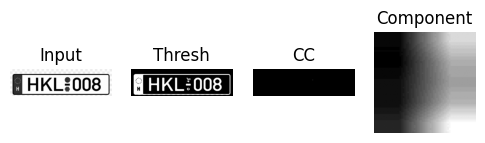

[490  88   1   1   1] [490.  88.]


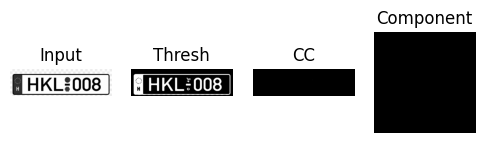

[461  91  19  17 170] [471.54117647  99.21176471]


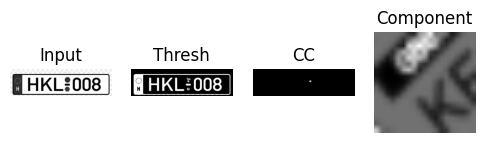

[452 120  40  15 579] [471.53195164 127.01036269]


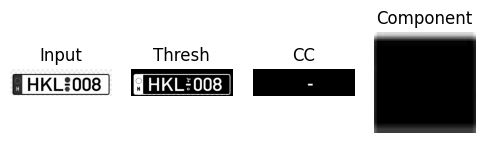

[460 152  23  23 267] [471.05617978 163.29588015]


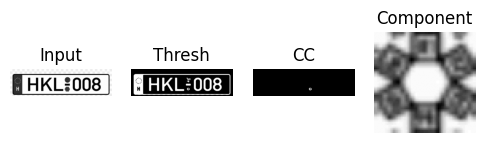

In [ ]:
for i in range(num_labels):
  temp = cc_image.copy()

  temp[cc_image == i] = 255
  temp[cc_image != i] = 0

  print(stats[i],centroids[i])
  x,y,w,h = stats[i][:4]
  area = stats[i][4]
  cx,cy = centroids[i]
  component = gray[y:y+h, x:x+w]
  component = cv2.resize(component,(64,64))
  plot_sidebyside([gray,thresh,temp,component],['Input','Thresh','CC','Component'],colormap='gray',figsize=(6,6))

#Filtering components by size
  We can observe that chars and numbers has a pattern in size (~110 pixels of heigth) that permit to filtering amoung others components.
  Lets, take a look!

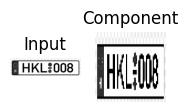

840 220


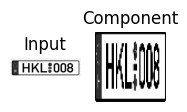

797 170


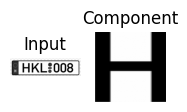

82 108


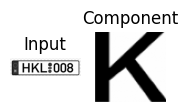

90 108


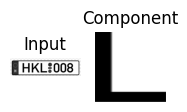

75 108


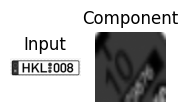

32 19


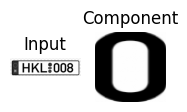

66 108


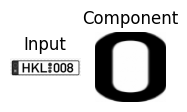

66 108


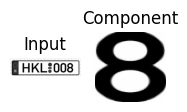

71 108


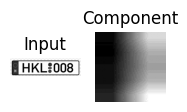

2 5


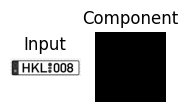

1 1


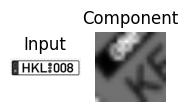

19 17


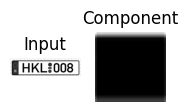

40 15


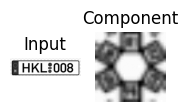

23 23


In [ ]:
for i in range(num_labels):
  temp = cc_image.copy()

  temp[cc_image == i] = 255
  temp[cc_image != i] = 0

  #x,y = top-left coordinates
  #w,h = width and height of bounding box
  x,y,w,h = stats[i][:4]

  #number of foreground pixels
  area = stats[i][4]

  #center of mass (cx,cy)
  cx,cy = centroids[i]

  component = gray[y:y+h, x:x+w]
  component = cv2.resize(component,(64,64))
  plot_sidebyside([gray,component],['Input','Component'],colormap='gray',figsize=(2,2))
  print(w,h)

Adicionamos um 'if' para filtrar apenas as letras e números

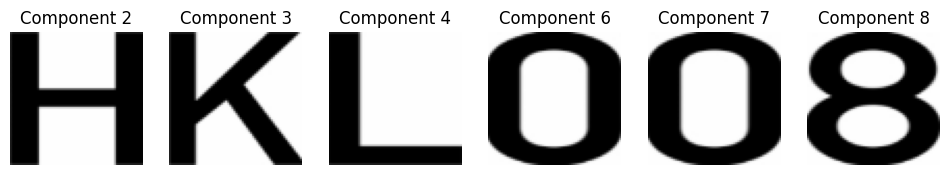

In [ ]:
comp_img = []
comp_str = []

for i in range(num_labels):
  temp = cc_image.copy()

  temp[cc_image == i] = 255
  temp[cc_image != i] = 0

  x,y,w,h = stats[i][:4]
  area = stats[i][4]
  cx,cy = centroids[i]


  if h > 90 and h < 130:
    component = gray[y:y+h, x:x+w]
    h,w = component.shape

    component = cv2.resize(component,(64,64))
    component = cv2.cvtColor(component,cv2.COLOR_GRAY2BGR)
    #cv2.rectangle(component,(0,0),(64,64),(255,0,0),thickness=3)
    comp_img.append(component)
    comp_str.append('Component ' + str(i))

    save_path = 'component_' + str(i) + '.png'
    cv2.imwrite(save_path,component)

plot_sidebyside(comp_img,comp_str,colormap='gray')



Now, it´s up to you! Try this approach to the other license plates.

* Challenge 01: Implement an algorithm that works for most plates. You will need to deal with size normalization, noise reduction, etc.

* Challenge 02: Classification Challenge: How can we determine the character?

   **Here´s a tip**: Try to implement an approach that computes an image difference to a character reference dataset set! The closest one is the char or number label. Moreover, search for the Template Matching technique and figure out how you can apply it to this end.

> The reasoning is to create a dataset with all the characters, commonly named 'reference dataset.' It is easy since you can draw them by using the function cv2.puttext.
> Then, for each character extracted from the license plate, you can compare it with the reference set. The closest one will determine the label.

Link for dataset:
https://github.com/andrehochuli/teaching/raw/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/dataset.zip




In [ ]:
!wget https://github.com/andrehochuli/teaching/raw/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/dataset.zip -O dataset.zip
!unzip dataset.zip


--2026-08-28 22:40:04--  https://github.com/andrehochuli/teaching/raw/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/dataset.zip
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/andrehochuli/teaching/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/dataset.zip [following]
--2026-08-28 22:40:04--  https://raw.githubusercontent.com/andrehochuli/teaching/main/ComputerVision/Lecture%2004%20-%20Finding%20Components/dataset.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2220323 (2.1M) [application/zip]
Saving to: ‘dataset.zip’

dataset.zip         100%[===================>]

#Solution

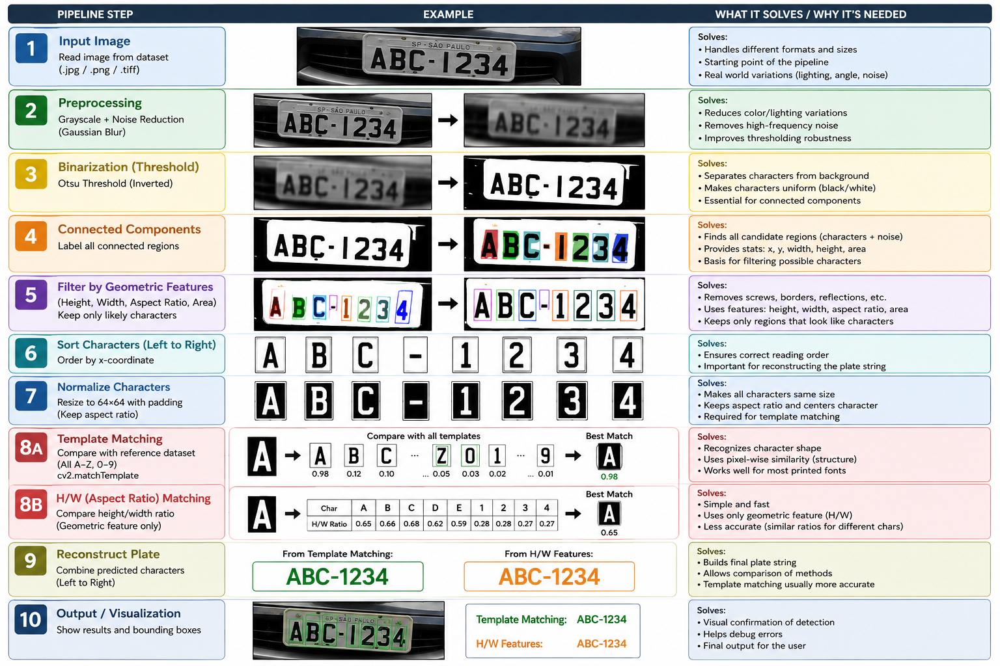

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import string

#Image Normalization

In [ ]:
def normalize_character(img, size=64, padding=6):

    # Ensure binary image
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find foreground pixels
    coords = cv2.findNonZero(img)

    if coords is None:
        return np.zeros((size, size), dtype=np.uint8)

    x, y, w, h = cv2.boundingRect(coords)

    char = img[y:y+h, x:x+w]

    # Available drawing region
    target = size - 2 * padding

    scale = min(target / w, target / h)

    new_w = max(1, int(w * scale))
    new_h = max(1, int(h * scale))

    char = cv2.resize(
        char,
        (new_w, new_h),
        interpolation=cv2.INTER_NEAREST
    )

    canvas = np.zeros((size, size), dtype=np.uint8)

    x0 = (size - new_w) // 2
    y0 = (size - new_h) // 2

    canvas[y0:y0+new_h, x0:x0+new_w] = char

    return canvas

#Reference Dataset

In [25]:
characters = string.ascii_uppercase + string.digits
print(characters)
reference_images = {}
reference_features = {}

font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1.8
thickness = 3

for char in characters:

    canvas = np.zeros((100, 100), dtype=np.uint8)

    # Determine text size
    (w, h), baseline = cv2.getTextSize(
        char,
        font,
        font_scale,
        thickness
    )

    x = (100 - w) // 2
    y = (100 + h) // 2

    cv2.putText(
        canvas,
        char,
        (x, y),
        font,
        font_scale,
        255,
        thickness,
        cv2.LINE_AA
    )

    # Binarize
    _, canvas = cv2.threshold(
        canvas,
        127,
        255,
        cv2.THRESH_BINARY
    )

    # Character geometric properties
    coords = cv2.findNonZero(canvas)

    x1, y1, cw, ch = cv2.boundingRect(coords)

    aspect_ratio = cw / ch

    reference_features[char] = np.array([
        aspect_ratio
    ])

    reference_images[char] = normalize_character(canvas)

ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789


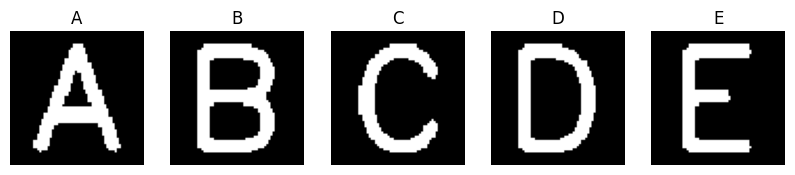

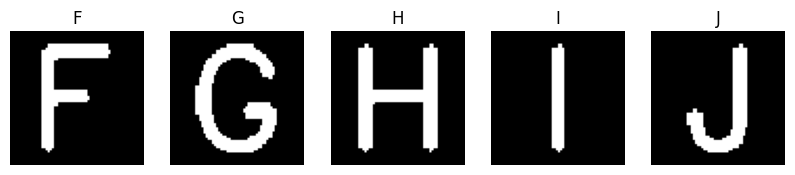

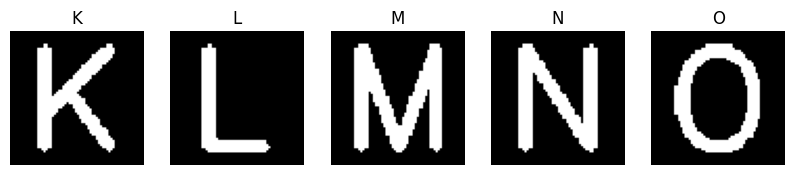

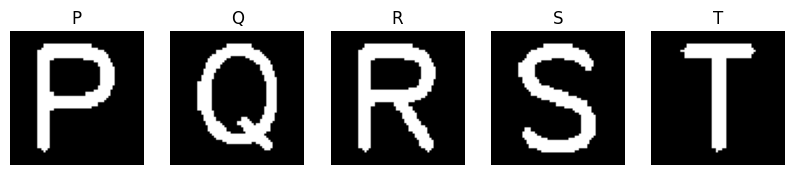

In [ ]:
items = list(reference_images.items())

for i in range(0, 20, 5):

    batch = items[i:i+5]

    images = [image for char, image in batch]
    titles = [char for char, image in batch]

    plot_sidebyside(
        images,
        titles,
        colormap='gray',
        figsize=(10, 2)
    )

## Classification using Template Matching

In [ ]:
def classify_template(component, references):

    best_char = None
    best_score = -1

    for char, template in references.items():

        result = cv2.matchTemplate(
            component,
            template,
            cv2.TM_CCOEFF_NORMED
        )

        score = result[0, 0]

        if score > best_score:
            best_score = score
            best_char = char

    return best_char, best_score

## Classification using Height/Width features

In [ ]:
def classify_hw(w, h, reference_features):

    feature = np.array([
        w / h
    ])

    best_char = None
    best_distance = float('inf')

    for char, ref_feature in reference_features.items():

        distance = np.linalg.norm(
            feature - ref_feature
        )

        if distance < best_distance:
            best_distance = distance
            best_char = char

    return best_char, best_distance

In [ ]:
import os

dataset_path = 'dataset/'

file_paths = []

for filename in os.listdir(dataset_path):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff')):
        file_paths.append(os.path.join(dataset_path, filename))

print(file_paths)

['dataset/qlgx125.jpg', 'dataset/wobav151.jpg', 'dataset/hh07194.png', 'dataset/es344.jpg', 'dataset/hrod819.jpg', 'dataset/pg589g.jpg', 'dataset/mbdt781.jpg', 'dataset/ancl550.jpg', 'dataset/spo7211.jpg', 'dataset/blam414.jpg', 'dataset/bq-708-gp.jpg', 'dataset/aba1234.jpg', 'dataset/hgaa7034.jpg', 'dataset/spr911.jpg', 'dataset/brl702.jpg', 'dataset/smb2062.jpg', 'dataset/vu99.jpg', 'dataset/wobnp301.jpg', 'dataset/wanne685.jpg', 'dataset/wobvr142.jpg', 'dataset/aaaa111.jpg', 'dataset/fck469.jpg', 'dataset/anal334.jpg', 'dataset/map7563.jpg', 'dataset/aaaa000.jpg', 'dataset/mbcl600.jpg', 'dataset/mgx1234.jpg', 'dataset/la5079.jpg', 'dataset/ina6310.jpg', 'dataset/bn158-58.jpg', 'dataset/fd2107h.jpg', 'dataset/rudcn890.jpg', 'dataset/fow653.png', 'dataset/mdt5157.jpg', 'dataset/bmw6220.jpg', 'dataset/ksc124.jpg', 'dataset/gaj169.jpg', 'dataset/wudy993.jpg', 'dataset/slsc56.jpg', 'dataset/smc9348.jpg', 'dataset/hhrd41.jpg', 'dataset/suff170.jpg', 'dataset/abgap33.jpg', 'dataset/smc1735


Processing: dataset/qlgx125.jpg
Connected Components: 11
Template Matching: JL6X126
H/W Features     : JJJJJJJ


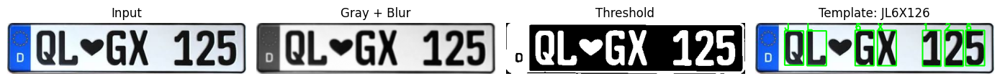

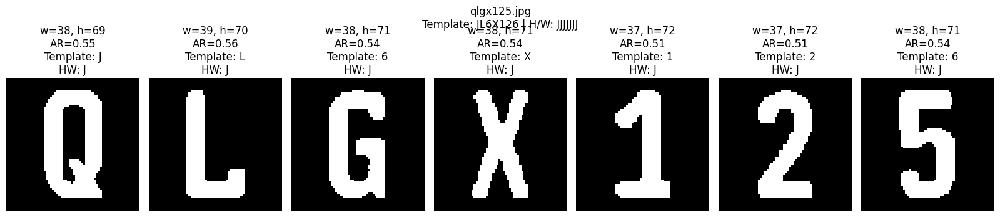


Processing: dataset/wobav151.jpg
Connected Components: 13
Template Matching: XJ6O4V161
H/W Features     : JJJWJJJJJ


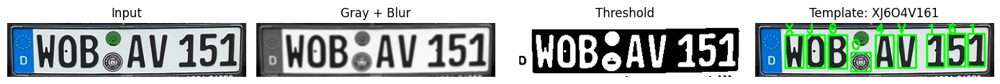

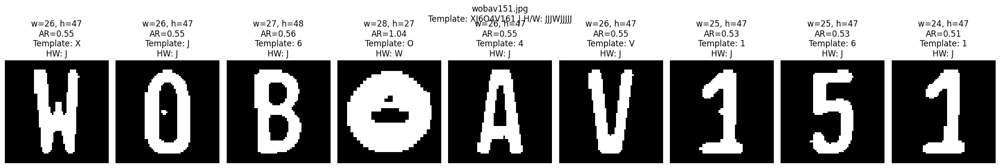


Processing: dataset/hh07194.png
Connected Components: 8
Template Matching: 8867194
H/W Features     : LLLJLLL


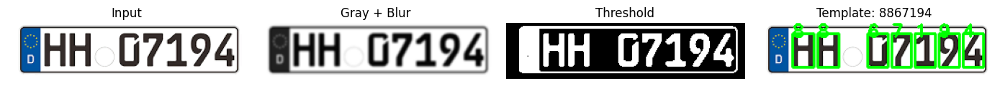

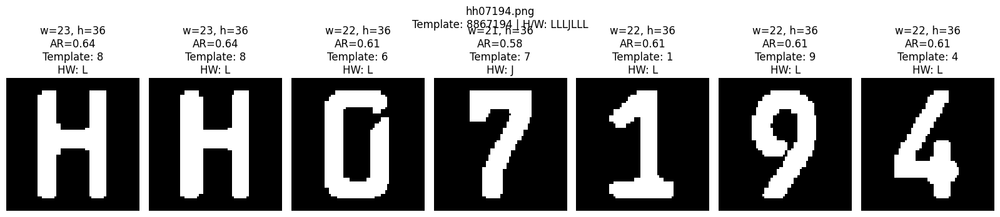


Processing: dataset/es344.jpg
Connected Components: 7
Template Matching: ES3
H/W Features     : BLL


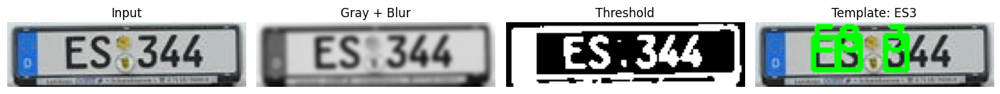

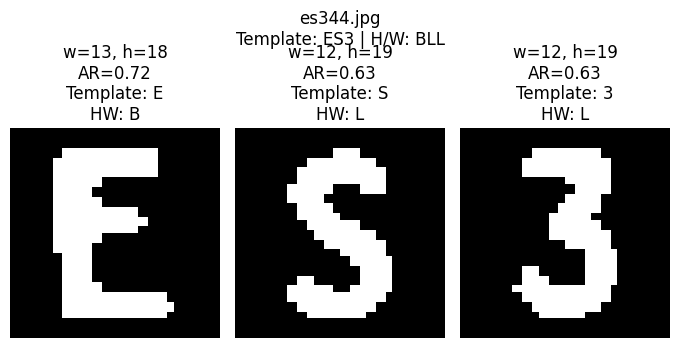


Processing: dataset/hrod819.jpg
Connected Components: 35
Template Matching: 8F096I9
H/W Features     : ELLLJJJ


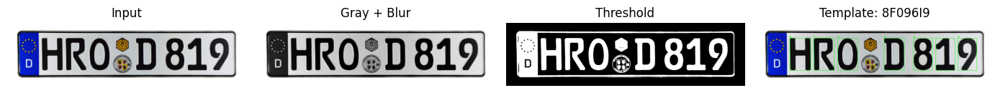

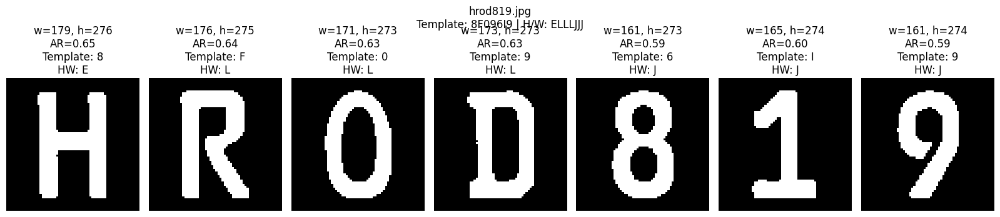


Processing: dataset/pg589g.jpg
Connected Components: 47
Template Matching: 26SJ96
H/W Features     : LLJLLL


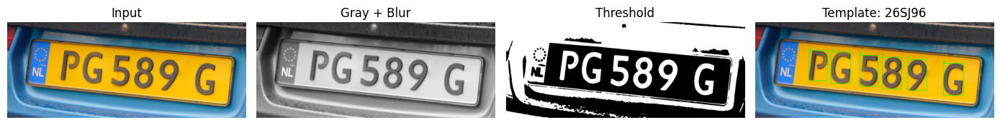

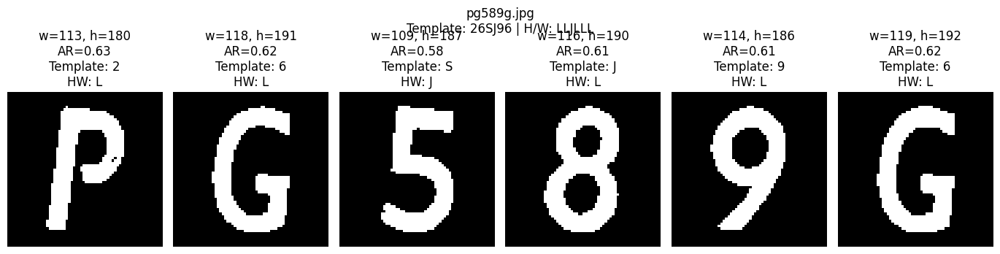


Processing: dataset/mbdt781.jpg
Connected Components: 73
Template Matching: 889T7J1
H/W Features     : LLLLJJJ


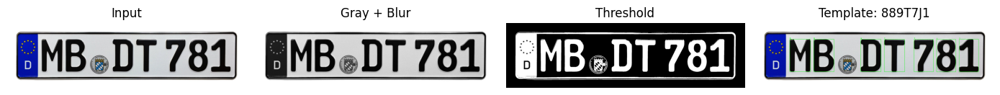

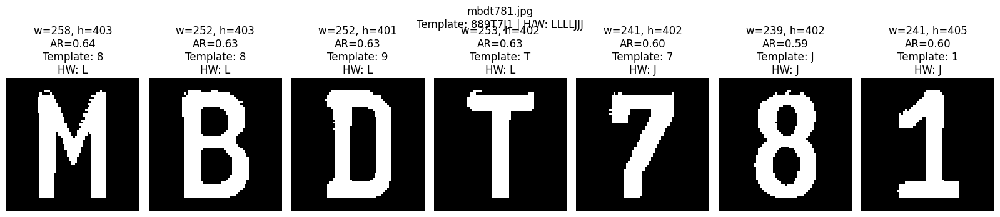


Processing: dataset/ancl550.jpg
Connected Components: 15
Template Matching: ANCL568
H/W Features     : JLJLJJJ


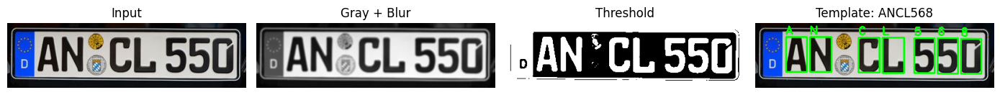

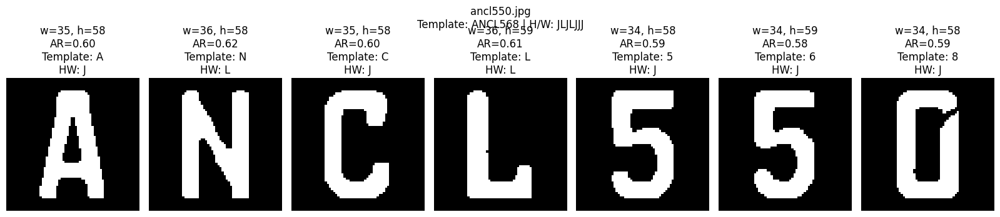


Processing: dataset/spo7211.jpg
Connected Components: 37
Template Matching: 62J72I1
H/W Features     : JJJJJJJ


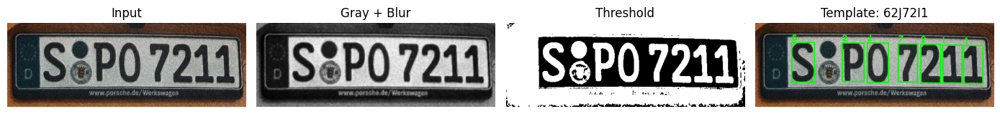

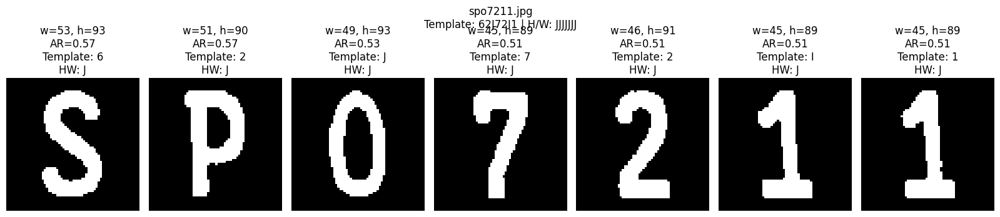


Processing: dataset/blam414.jpg
Connected Components: 16
Template Matching: 6LZA8414
H/W Features     : LLWJLJJJ


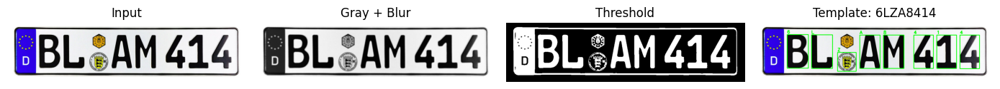

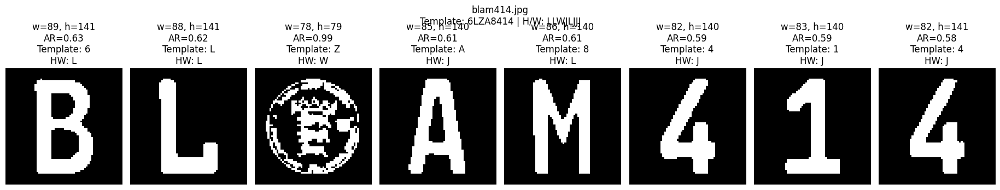


Processing: dataset/bq-708-gp.jpg
Connected Components: 62
Template Matching: 8J7J998
H/W Features     : JJJJJJJ


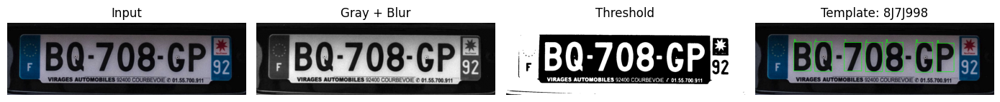

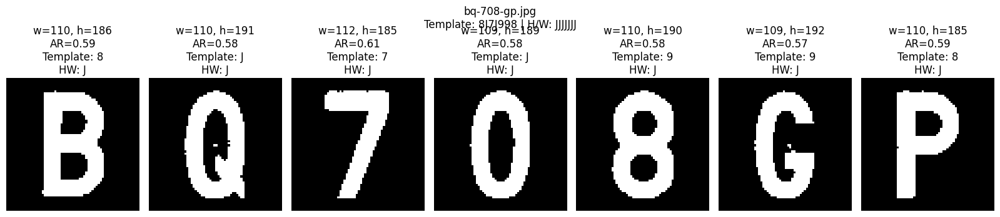


Processing: dataset/aba1234.jpg
Connected Components: 11
Template Matching: A8MA1234
H/W Features     : KEAKJJJL


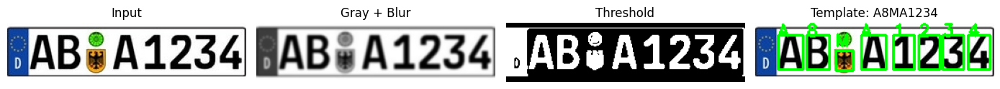

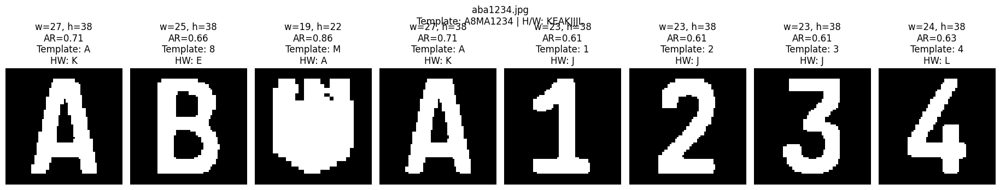


Processing: dataset/hgaa7034.jpg
Connected Components: 13
Template Matching: J6447634
H/W Features     : JJJJJJJJ


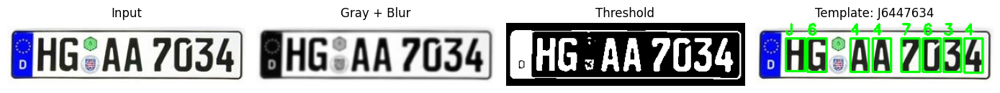

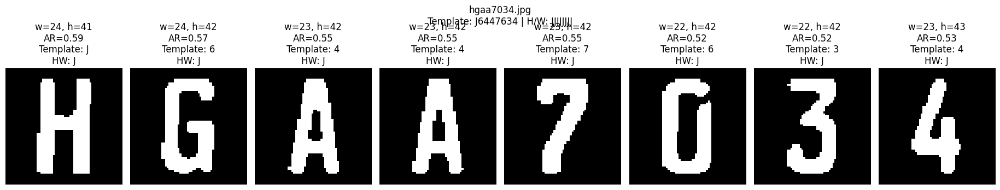


Processing: dataset/spr911.jpg
Connected Components: 39
Template Matching: S98911
H/W Features     : LLLJJJ


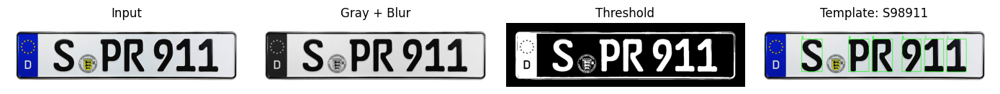

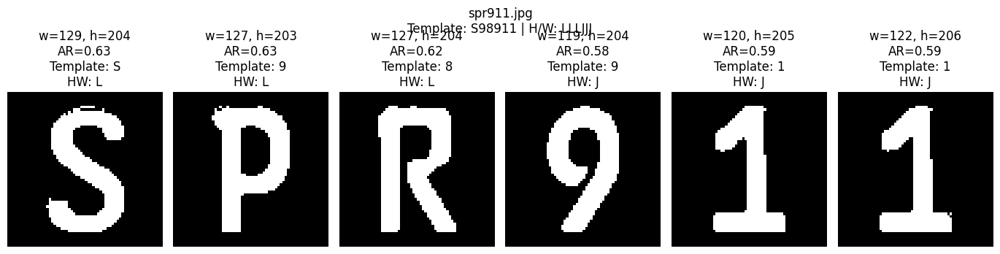


Processing: dataset/brl702.jpg
Connected Components: 10
Template Matching: 8RL762
H/W Features     : LLLJJJ


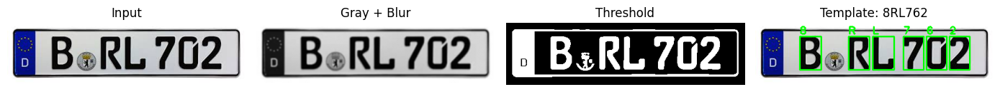

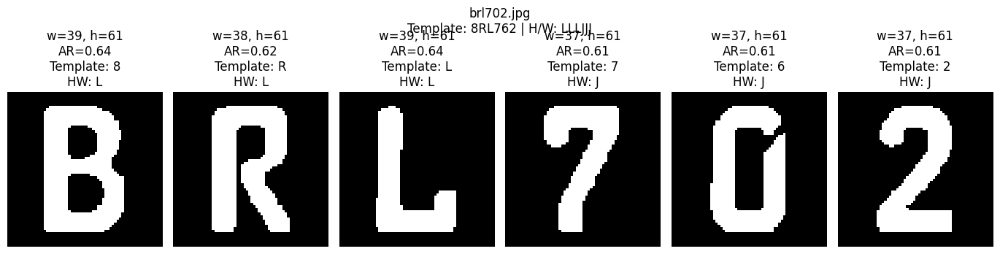


Processing: dataset/smb2062.jpg
Connected Components: 27
Template Matching: S862662
H/W Features     : LLLJJJJ


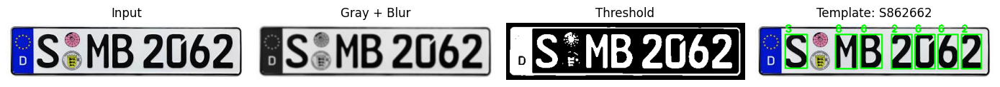

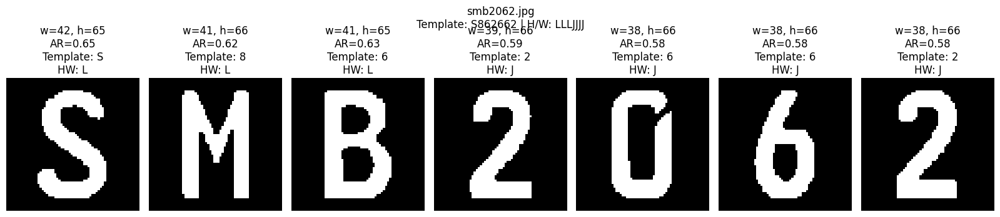


Processing: dataset/vu99.jpg
Connected Components: 7
Template Matching: VJ99
H/W Features     : LLJJ


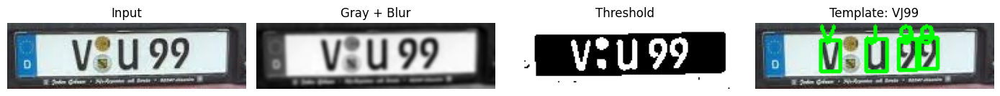

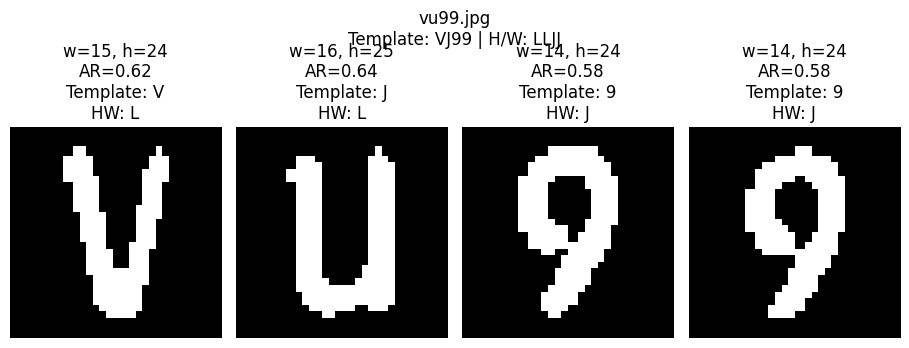


Processing: dataset/wobnp301.jpg
Connected Components: 12
Template Matching: JJ6X23J1
H/W Features     : JJJJJJJJ


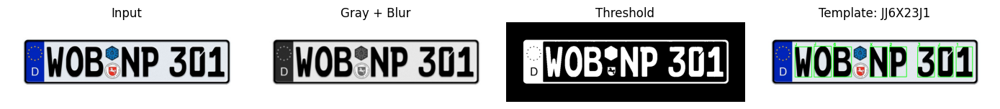

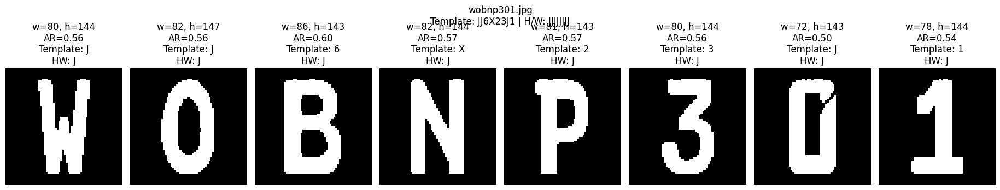


Processing: dataset/wanne685.jpg
Connected Components: 18
Template Matching: J4JJE446
H/W Features     : JJJJJJJJ


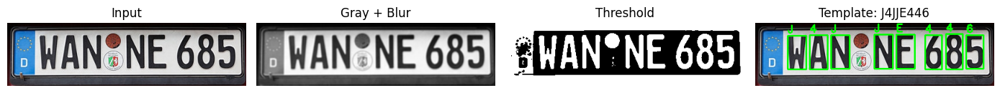

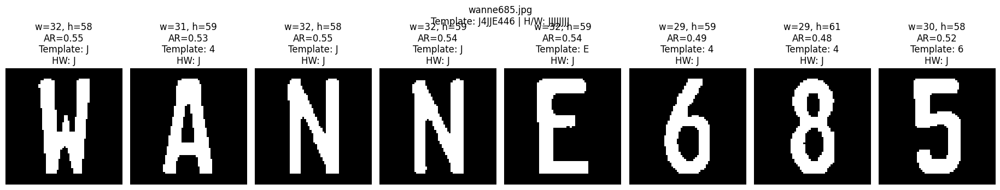


Processing: dataset/wobvr142.jpg
Connected Components: 11
Template Matching: JJ6V2142
H/W Features     : JJJJJJJJ


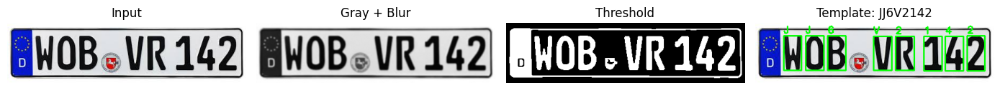

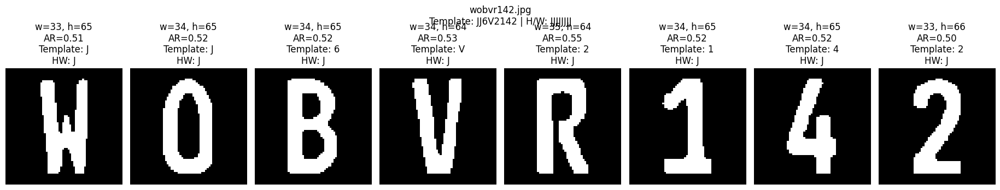


Processing: dataset/aaaa111.jpg
Connected Components: 10
Template Matching: AAAATTI
H/W Features     : KTTK111


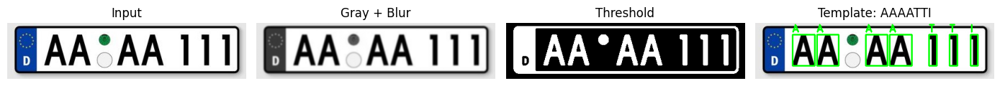

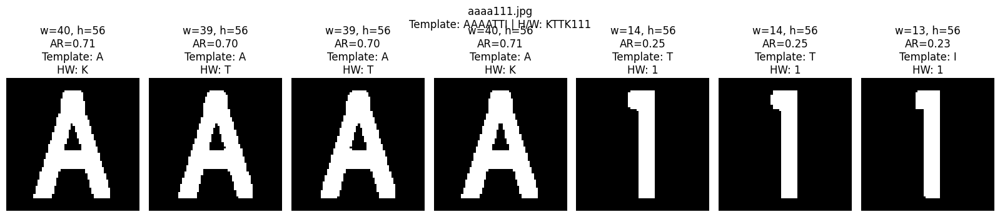


Processing: dataset/fck469.jpg
Connected Components: 21
Template Matching: F0K469
H/W Features     : LLLJJJ


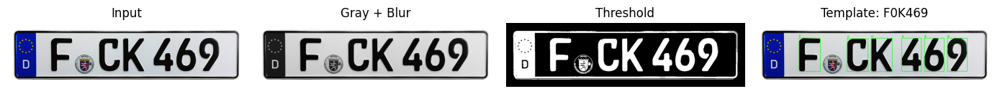

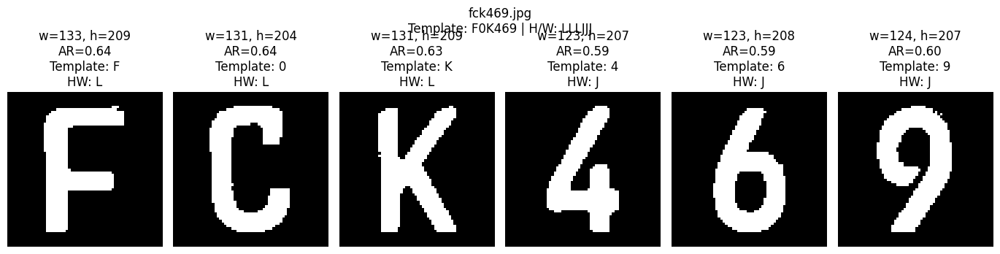


Processing: dataset/anal334.jpg
Connected Components: 10
Template Matching: ANAL334
H/W Features     : L2L2LJL


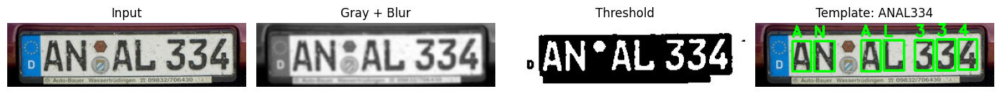

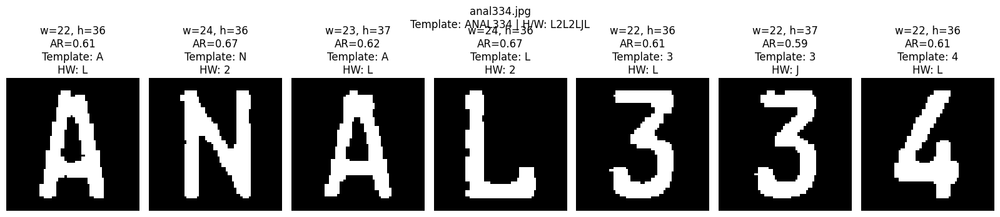


Processing: dataset/map7563.jpg
Connected Components: 22
Template Matching: NA97663
H/W Features     : ELLLJJJ


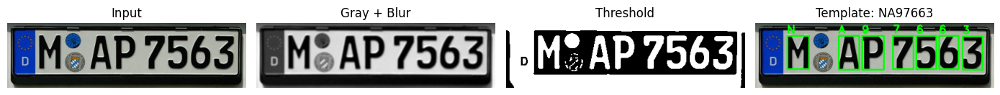

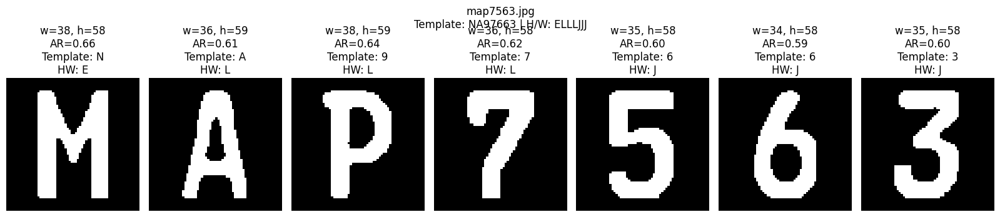


Processing: dataset/aaaa000.jpg
Connected Components: 21
Template Matching: WWWWJJ9
H/W Features     : JJJJJJJ


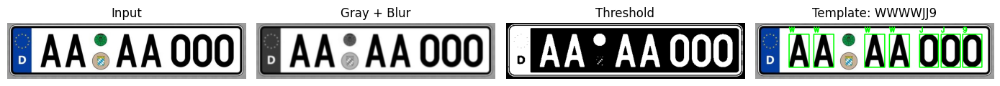

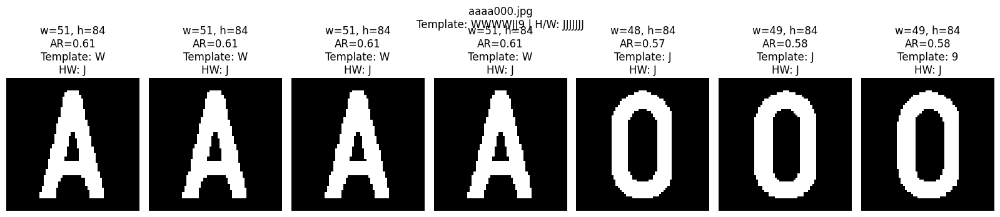


Processing: dataset/mbcl600.jpg
Connected Components: 16
Template Matching: 88CL688
H/W Features     : LLLLJLJ


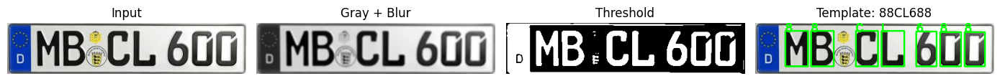

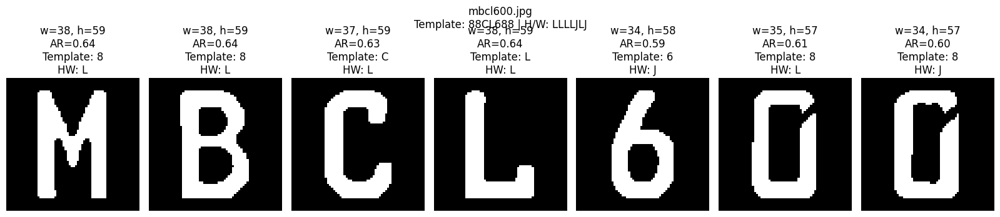


Processing: dataset/mgx1234.jpg
Connected Components: 9
Template Matching: M9X1234
H/W Features     : WJJJJJJ


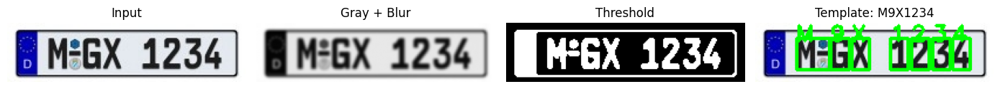

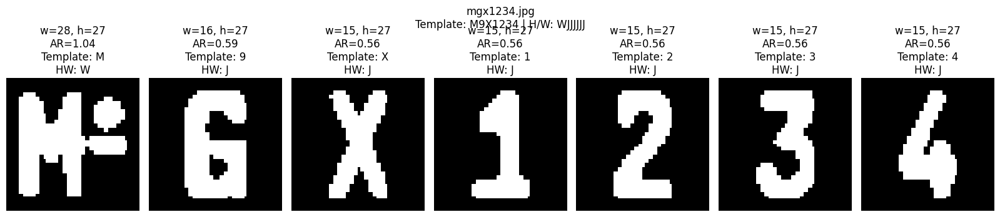


Processing: dataset/la5079.jpg
Connected Components: 27
Template Matching: L8A6979
H/W Features     : LWLJJJJ


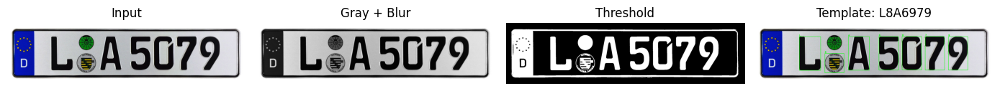

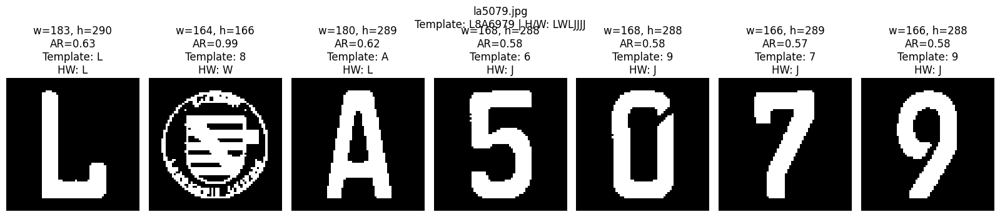


Processing: dataset/ina6310.jpg
Connected Components: 9
Template Matching: I8A431J
H/W Features     : JLJJJJJ


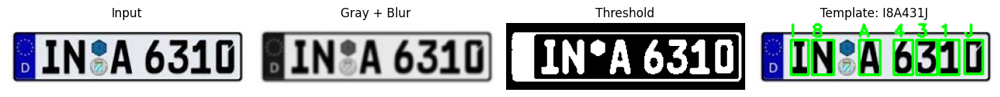

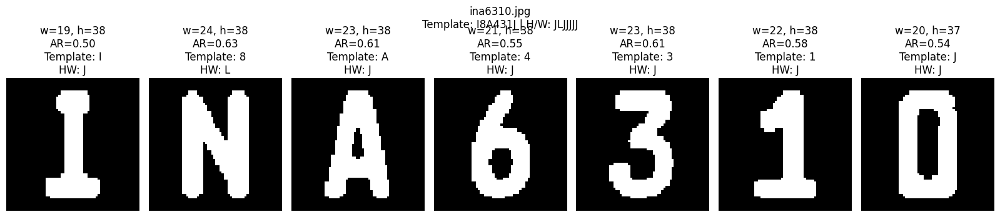


Processing: dataset/bn158-58.jpg
Connected Components: 10
Template Matching: 6N15656
H/W Features     : EEJJJJJ


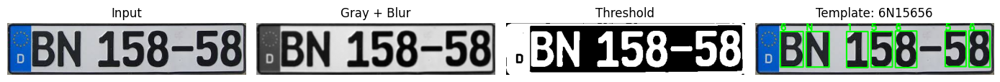

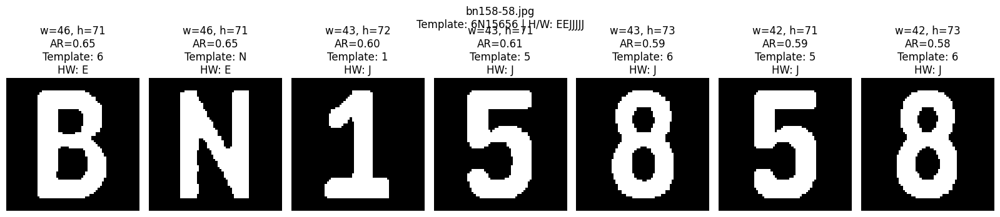


Processing: dataset/fd2107h.jpg
Connected Components: 11
Template Matching: F02167HI
H/W Features     : L2LJLLGI


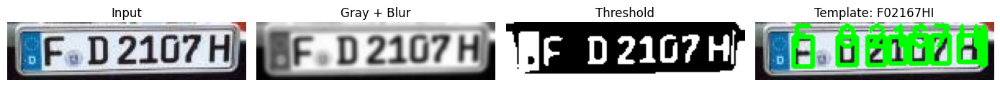

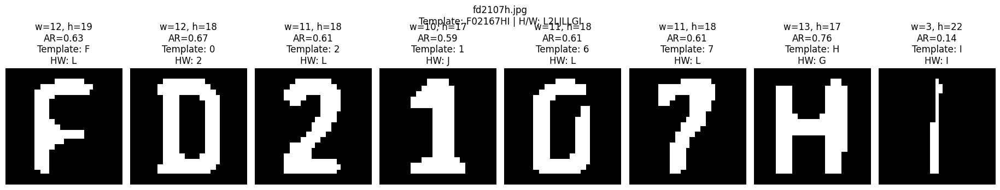


Processing: dataset/rudcn890.jpg
Connected Components: 14
Template Matching: 2UJ6X696
H/W Features     : JTJJJJJJ


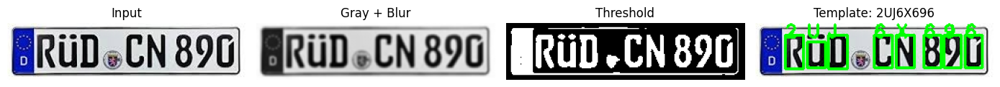

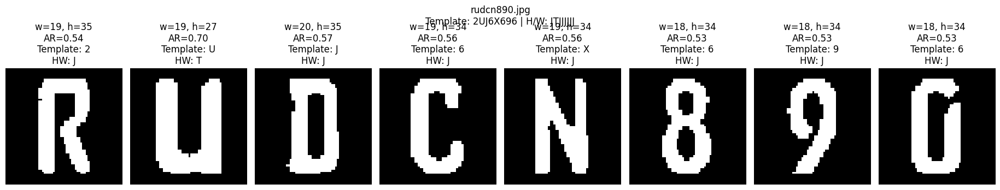


Processing: dataset/fow653.png
Connected Components: 25
Template Matching: F09653
H/W Features     : LLLLLL


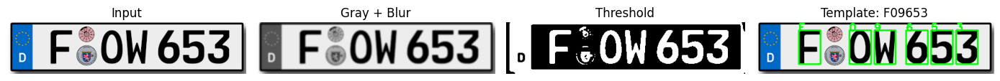

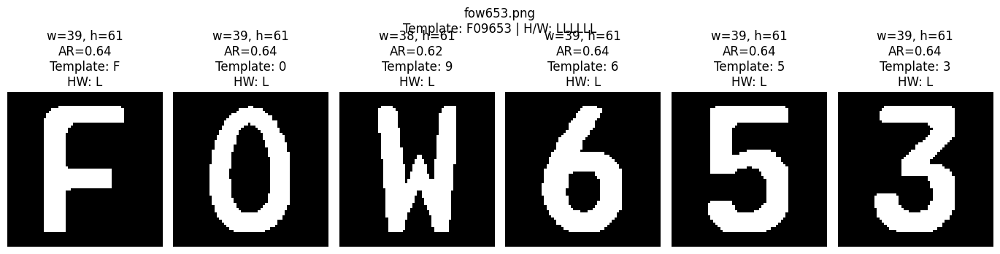


Processing: dataset/mdt5157.jpg
Connected Components: 17
Template Matching: N9T5167
H/W Features     : ELLJJLJ


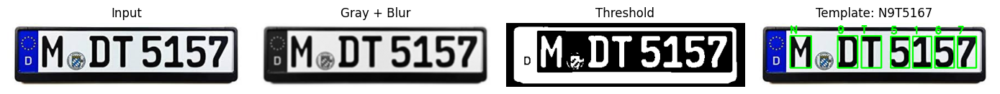

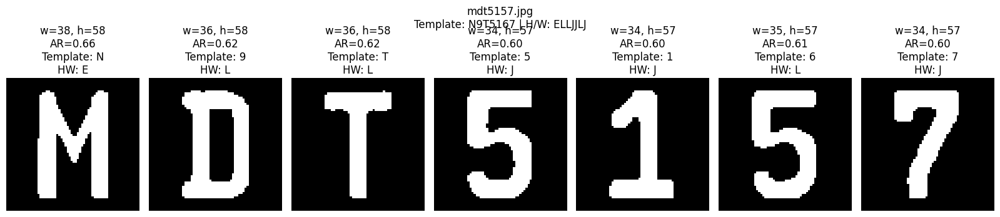


Processing: dataset/bmw6220.jpg
Connected Components: 14
Template Matching: 88V6220
H/W Features     : 2LLJJJL


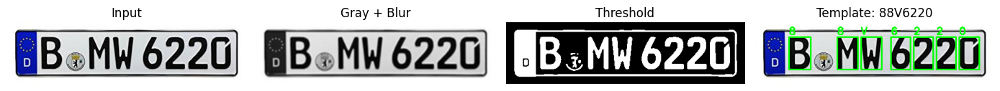

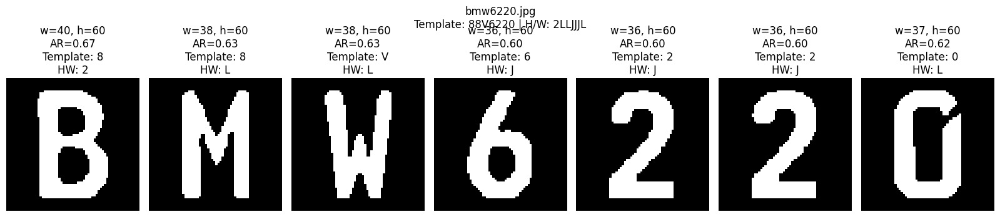


Processing: dataset/ksc124.jpg
Connected Components: 14
Template Matching: KSC124
H/W Features     : ELLJLJ


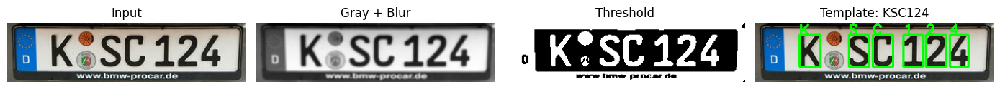

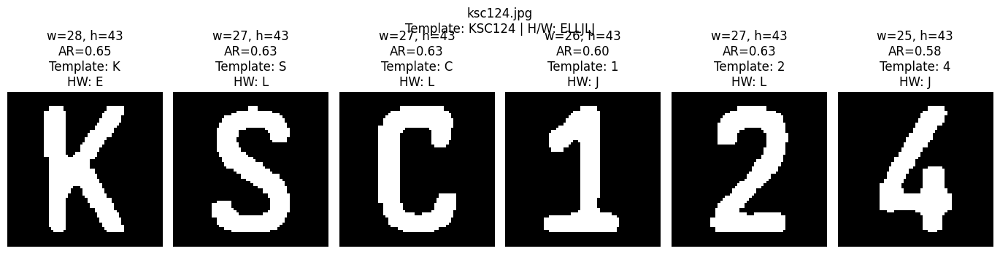


Processing: dataset/gaj169.jpg
Connected Components: 11
Template Matching: 6AJ169
H/W Features     : LLLJLJ


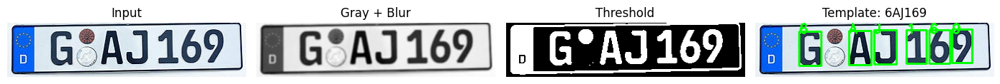

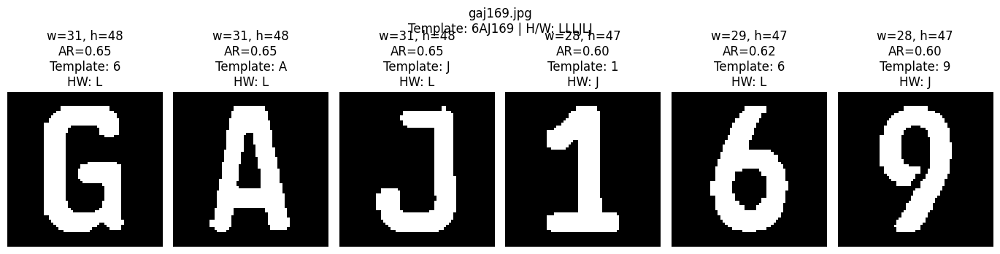


Processing: dataset/wudy993.jpg
Connected Components: 15
Template Matching: JU69Y993
H/W Features     : LOWLLJJJ


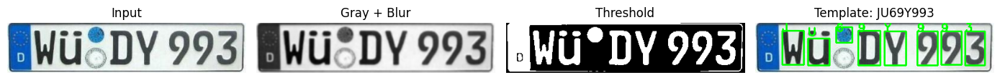

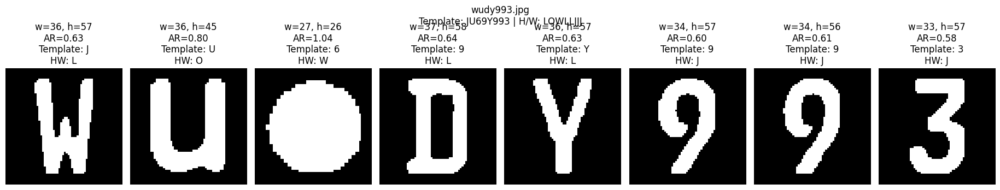


Processing: dataset/slsc56.jpg
Connected Components: 10
Template Matching: SLS9666
H/W Features     : LLLWLJJ


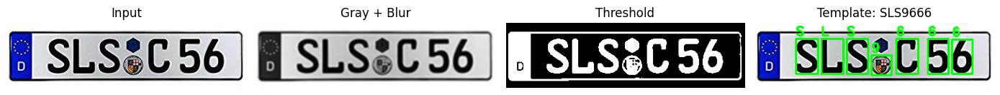

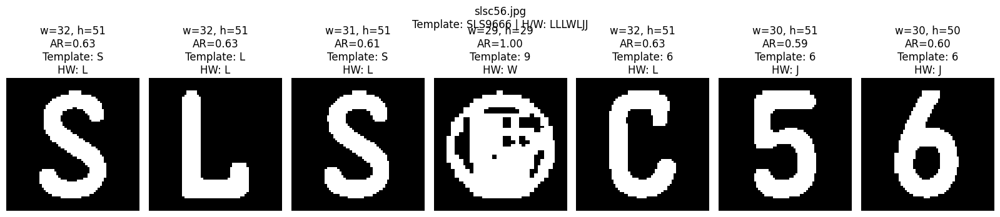


Processing: dataset/smc9348.jpg
Connected Components: 9
Template Matching: S809346
H/W Features     : LLLJJJL


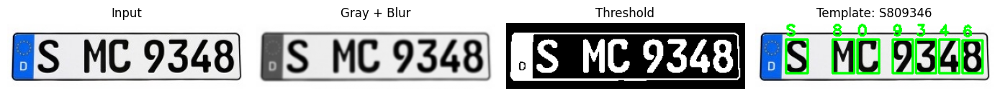

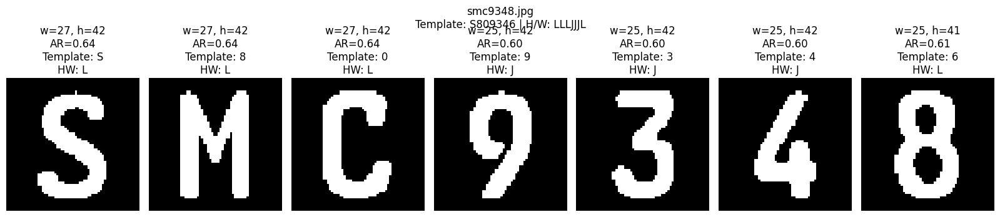


Processing: dataset/hhrd41.jpg
Connected Components: 10
Template Matching: 88F84I
H/W Features     : T2L2LJ


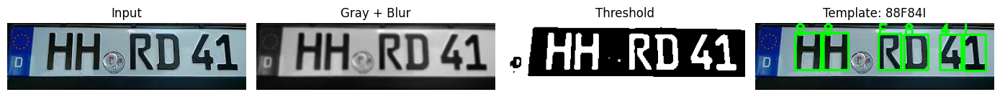

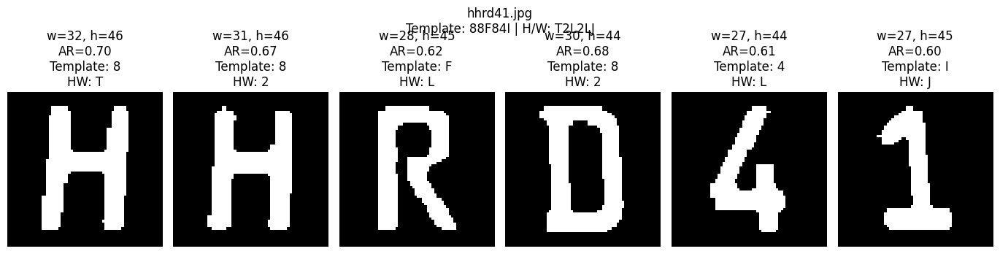


Processing: dataset/suff170.jpg
Connected Components: 6
Template Matching: 
H/W Features     : 


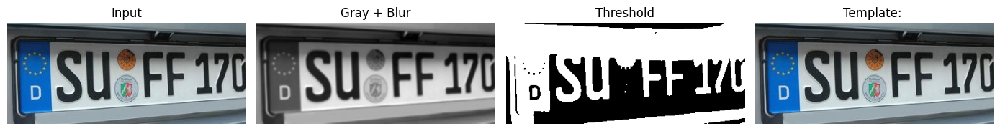

No character candidates detected.

Processing: dataset/abgap33.jpg
Connected Components: 41
Template Matching: A664A933
H/W Features     : LLLWLLJJ


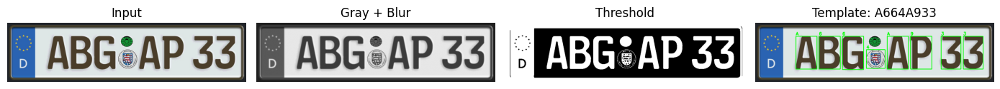

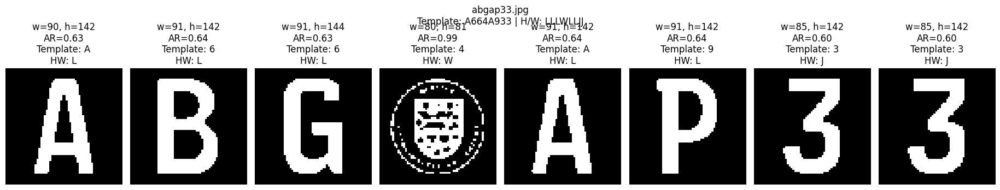


Processing: dataset/smc1735.jpg
Connected Components: 43
Template Matching: 6801735
H/W Features     : LELJJJJ


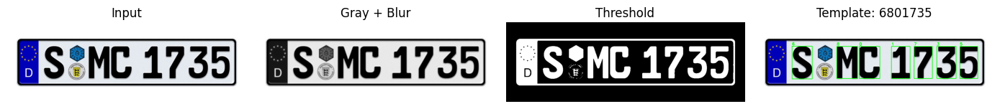

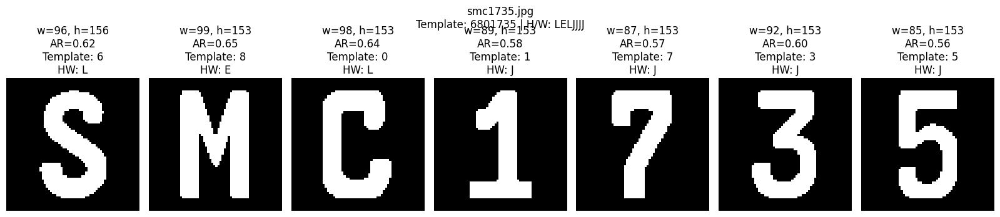


Processing: dataset/smb2078.jpg
Connected Components: 11
Template Matching: S862676
H/W Features     : LLLJJJJ


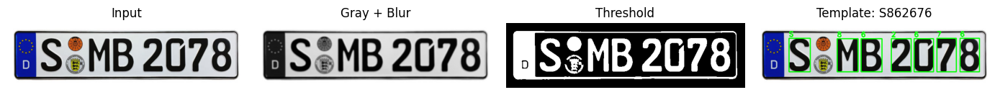

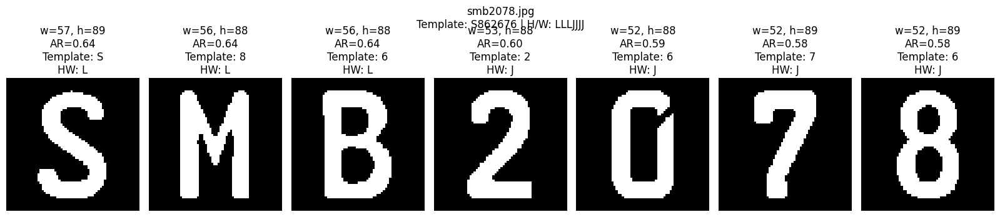

In [ ]:
for path in file_paths:

    print('\nProcessing:', path)

    # ============================================================
    # 1. READ IMAGE
    # ============================================================

    img = cv2.imread(path)

    if img is None:
        print('Error reading image.')
        continue

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


    # ============================================================
    # 2. PREPROCESSING
    # ============================================================

    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    _, thresh = cv2.threshold(
        gray,
        0,
        255,
        cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
    )


    # ============================================================
    # 3. CONNECTED COMPONENTS
    # ============================================================

    num_labels, cc_image, stats, centroids = \
        cv2.connectedComponentsWithStats(
            thresh,
            8,
            cv2.CV_32S
        )

    print('Connected Components:', num_labels - 1)


    # ============================================================
    # 4. CHARACTER CANDIDATES
    # ============================================================

    plate_h, plate_w = gray.shape

    components = []

    for i in range(1, num_labels):

        x, y, w, h, area = stats[i]

        # Geometric features
        relative_h = h / plate_h
        relative_w = w / plate_w
        aspect_ratio = w / h

        # Character filtering
        if (
            0.30 < relative_h < 0.95 and
            0.01 < relative_w < 0.30 and
            0.10 < aspect_ratio < 1.20 and
            area > 30
        ):

            component = thresh[y:y+h, x:x+w]

            component_norm = normalize_character(
                component
            )

            components.append({
                'label': i,
                'x': x,
                'y': y,
                'w': w,
                'h': h,
                'area': area,
                'aspect_ratio': aspect_ratio,
                'image': component,
                'normalized': component_norm
            })


    # ============================================================
    # 5. SORT LEFT -> RIGHT
    # ============================================================

    components = sorted(
        components,
        key=lambda c: c['x']
    )


    # ============================================================
    # 6. CLASSIFICATION
    # ============================================================

    for comp in components:

        # Template Matching
        template_char, template_score = classify_template(
            comp['normalized'],
            reference_images
        )

        # Height / Width
        hw_char, hw_distance = zd(
            comp['w'],
            comp['h'],
            reference_features
        )

        comp['template_char'] = template_char
        comp['template_score'] = template_score

        comp['hw_char'] = hw_char
        comp['hw_distance'] = hw_distance


    # ============================================================
    # 7. PLATE PREDICTION
    # ============================================================

    plate_template = ''.join(
        c['template_char']
        for c in components
    )

    plate_hw = ''.join(
        c['hw_char']
        for c in components
    )

    print('Template Matching:', plate_template)
    print('H/W Features     :', plate_hw)


    # ============================================================
    # 8. DRAW BOUNDING BOXES
    # ============================================================

    result = img.copy()

    for comp in components:

        x = comp['x']
        y = comp['y']
        w = comp['w']
        h = comp['h']

        cv2.rectangle(
            result,
            (x, y),
            (x+w, y+h),
            (0, 255, 0),
            2
        )

        cv2.putText(
            result,
            comp['template_char'],
            (x, max(15, y-5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (0, 255, 0),
            2
        )


    # ============================================================
    # 9. PLOT PIPELINE
    # ============================================================

    plt.figure(figsize=(14, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Input')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(gray, cmap='gray')
    plt.title('Gray + Blur')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(thresh, cmap='gray')
    plt.title('Threshold')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(f'Template: {plate_template}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


    # ============================================================
    # 10. PLOT EACH CHARACTER
    # ============================================================

    n = len(components)

    if n == 0:
        print('No character candidates detected.')
        continue

    fig, axes = plt.subplots(
        1,
        n,
        figsize=(2.3 * n, 4)
    )

    if n == 1:
        axes = [axes]

    for ax, comp in zip(axes, components):

        ax.imshow(
            comp['normalized'],
            cmap='gray'
        )

        ax.set_title(
            f"w={comp['w']}, h={comp['h']}\n"
            f"AR={comp['aspect_ratio']:.2f}\n"
            f"Template: {comp['template_char']}\n"
            f"HW: {comp['hw_char']}"
        )

        ax.axis('off')

    plt.suptitle(
        f'{os.path.basename(path)}\n'
        f'Template: {plate_template} | '
        f'H/W: {plate_hw}'
    )

    plt.tight_layout()
    plt.show()